In [16]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.model_selection import train_test_split

sns.set_style('darkgrid')
plt.rcParams['font.size'] = 14
plt.rcParams['figure.figsize'] = (10, 6)
plt.rcParams['figure.facecolor'] = '#00000000'


In [4]:
df = pd.read_csv('../data/weatherAUS.csv')
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
145458,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [6]:
df.isnull().sum()

Date                 0
Location             0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
RainTomorrow      3267
dtype: int64

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

In [12]:
df.dropna(subset = ['RainToday','RainTomorrow'], inplace=True)

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 140787 entries, 0 to 145458
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           140787 non-null  object 
 1   Location       140787 non-null  object 
 2   MinTemp        140319 non-null  float64
 3   MaxTemp        140480 non-null  float64
 4   Rainfall       140787 non-null  float64
 5   Evaporation    81093 non-null   float64
 6   Sunshine       73982 non-null   float64
 7   WindGustDir    131624 non-null  object 
 8   WindGustSpeed  131682 non-null  float64
 9   WindDir9am     131127 non-null  object 
 10  WindDir3pm     137117 non-null  object 
 11  WindSpeed9am   139732 non-null  float64
 12  WindSpeed3pm   138256 non-null  float64
 13  Humidity9am    139270 non-null  float64
 14  Humidity3pm    137286 non-null  float64
 15  Pressure9am    127044 non-null  float64
 16  Pressure3pm    127018 non-null  float64
 17  Cloud9am       88162 non-null   fl

In [18]:
px.histogram(df, x='Location', color=df['RainToday'], title ='Location and RainToday')

c:\Users\DELL\anaconda3\envs\myenv\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'alignmentgroup': 'True',
              'bingroup': 'x',
              'hovertemplate': 'RainToday=No<br>Location=%{x}<br>count=%{y}<extra></extra>',
              'legendgroup': 'No',
              'marker': {'color': '#636efa', 'pattern': {'shape': ''}},
              'name': 'No',
              'offsetgroup': 'No',
              'orientation': 'v',
              'showlegend': True,
              'type': 'histogram',
              'x': array(['Albury', 'Albury', 'Albury', ..., 'Uluru', 'Uluru', 'Uluru'],
                         dtype=object),
              'xaxis': 'x',
              'yaxis': 'y'},
             {'alignmentgroup': 'True',
              'bingroup': 'x',
              'hovertemplate': 'RainToday=Yes<br>Location=%{x}<br>count=%{y}<extra></extra>',
              'legendgroup': 'Yes',
              'marker': {'color': '#EF553B', 'pattern': {'shape': ''}},
              'name': 'Yes',
              'offsetgroup': 'Yes',
              'orientation': 'v',
              'showlegend': True,
              'type': 'histogram',
              'x': array(['Albury', 'Albury', 'Albury', ..., 'Uluru', 'Uluru', 'Uluru'],
                         dtype=object),
              'xaxis': 'x',
              'yaxis': 'y'}],
    'layout': {'barmode': 'relative',
               'legend': {'title': {'text': 'RainToday'}, 'tracegroupgap': 0},
               'template': '...',
               'title': {'text': 'Location and RainToday'},
               'xaxis': {'anchor': 'y', 'domain': [0.0, 1.0], 'title': {'text': 'Location'}},
               'yaxis': {'anchor': 'x', 'domain': [0.0, 1.0], 'title': {'text': 'count'}}}
})

In [20]:
px.histogram(df, x='Temp3pm', color=df['RainTomorrow'], title="Temperature at 3 pm vs Rain tomorrow")

c:\Users\DELL\anaconda3\envs\myenv\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'alignmentgroup': 'True',
              'bingroup': 'x',
              'hovertemplate': 'RainTomorrow=No<br>Temp3pm=%{x}<br>count=%{y}<extra></extra>',
              'legendgroup': 'No',
              'marker': {'color': '#636efa', 'pattern': {'shape': ''}},
              'name': 'No',
              'offsetgroup': 'No',
              'orientation': 'v',
              'showlegend': True,
              'type': 'histogram',
              'x': array([21.8, 24.3, 23.2, ..., 24.5, 26.1, 26. ]),
              'xaxis': 'x',
              'yaxis': 'y'},
             {'alignmentgroup': 'True',
              'bingroup': 'x',
              'hovertemplate': 'RainTomorrow=Yes<br>Temp3pm=%{x}<br>count=%{y}<extra></extra>',
              'legendgroup': 'Yes',
              'marker': {'color': '#EF553B', 'pattern': {'shape': ''}},
              'name': 'Yes',
              'offsetgroup': 'Yes',
              'orientation': 'v',
              'showlegend': True,
              'type': 'histogram',
              'x': array([30.2, 28.8, 17. , ..., 21.2, 26. , 26.9]),
              'xaxis': 'x',
              'yaxis': 'y'}],
    'layout': {'barmode': 'relative',
               'legend': {'title': {'text': 'RainTomorrow'}, 'tracegroupgap': 0},
               'template': '...',
               'title': {'text': 'Temperature at 3 pm vs Rain tomorrow'},
               'xaxis': {'anchor': 'y', 'domain': [0.0, 1.0], 'title': {'text': 'Temp3pm'}},
               'yaxis': {'anchor': 'x', 'domain': [0.0, 1.0], 'title': {'text': 'count'}}}
})

In [21]:
px.histogram(df, x='RainTomorrow', color=df["RainToday"], title="RainToday vs RainTomorrow")

c:\Users\DELL\anaconda3\envs\myenv\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'alignmentgroup': 'True',
              'bingroup': 'x',
              'hovertemplate': 'RainToday=No<br>RainTomorrow=%{x}<br>count=%{y}<extra></extra>',
              'legendgroup': 'No',
              'marker': {'color': '#636efa', 'pattern': {'shape': ''}},
              'name': 'No',
              'offsetgroup': 'No',
              'orientation': 'v',
              'showlegend': True,
              'type': 'histogram',
              'x': array(['No', 'No', 'No', ..., 'No', 'No', 'No'], dtype=object),
              'xaxis': 'x',
              'yaxis': 'y'},
             {'alignmentgroup': 'True',
              'bingroup': 'x',
              'hovertemplate': 'RainToday=Yes<br>RainTomorrow=%{x}<br>count=%{y}<extra></extra>',
              'legendgroup': 'Yes',
              'marker': {'color': '#EF553B', 'pattern': {'shape': ''}},
              'name': 'Yes',
              'offsetgroup': 'Yes',
              'orientation': 'v',
              'showlegend': True,
              'type': 'histogram',
              'x': array(['No', 'Yes', 'Yes', ..., 'Yes', 'Yes', 'No'], dtype=object),
              'xaxis': 'x',
              'yaxis': 'y'}],
    'layout': {'barmode': 'relative',
               'legend': {'title': {'text': 'RainToday'}, 'tracegroupgap': 0},
               'template': '...',
               'title': {'text': 'RainToday vs RainTomorrow'},
               'xaxis': {'anchor': 'y', 'domain': [0.0, 1.0], 'title': {'text': 'RainTomorrow'}},
               'yaxis': {'anchor': 'x', 'domain': [0.0, 1.0], 'title': {'text': 'count'}}}
})

In [22]:
px.scatter(df.sample(2000), title="Min vs Max temperatures", x='MinTemp', y='MaxTemp', color="RainToday")

c:\Users\DELL\anaconda3\envs\myenv\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'hovertemplate': 'RainToday=Yes<br>MinTemp=%{x}<br>MaxTemp=%{y}<extra></extra>',
              'legendgroup': 'Yes',
              'marker': {'color': '#636efa', 'symbol': 'circle'},
              'mode': 'markers',
              'name': 'Yes',
              'showlegend': True,
              'type': 'scattergl',
              'x': array([11.6,  9.2,  5.5, ..., 18. , 19.5,  6.3]),
              'xaxis': 'x',
              'y': array([17.5, 13.9, 15.8, ..., 25. , 21.4, 14. ]),
              'yaxis': 'y'},
             {'hovertemplate': 'RainToday=No<br>MinTemp=%{x}<br>MaxTemp=%{y}<extra></extra>',
              'legendgroup': 'No',
              'marker': {'color': '#EF553B', 'symbol': 'circle'},
              'mode': 'markers',
              'name': 'No',
              'showlegend': True,
              'type': 'scattergl',
              'x': array([ 1.4,  8.5, 15.5, ...,  9.7,  2.8, 10.2]),
              'xaxis': 'x',
              'y': array([25.5, 22.6, 19.2, ..., 15.2, 14.3, 17.2]),
              'yaxis': 'y'}],
    'layout': {'legend': {'title': {'text': 'RainToday'}, 'tracegroupgap': 0},
               'template': '...',
               'title': {'text': 'Min vs Max temperatures'},
               'xaxis': {'anchor': 'y', 'domain': [0.0, 1.0], 'title': {'text': 'MinTemp'}},
               'yaxis': {'anchor': 'x', 'domain': [0.0, 1.0], 'title': {'text': 'MaxTemp'}}}
})

In [23]:
px.strip(df.sample(2000), x='Temp3pm', y='Humidity3pm', title="Humidity at 3 pm vs Temperature at 3 pm", color="RainTomorrow")

c:\Users\DELL\anaconda3\envs\myenv\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'alignmentgroup': 'True',
              'boxpoints': 'all',
              'fillcolor': 'rgba(255,255,255,0)',
              'hoveron': 'points',
              'hovertemplate': 'RainTomorrow=No<br>Temp3pm=%{x}<br>Humidity3pm=%{y}<extra></extra>',
              'legendgroup': 'No',
              'line': {'color': 'rgba(255,255,255,0)'},
              'marker': {'color': '#636efa'},
              'name': 'No',
              'offsetgroup': 'No',
              'orientation': 'v',
              'pointpos': 0,
              'showlegend': True,
              'type': 'box',
              'x': array([23.1, 25.1, 22.5, ..., 27.8, 32.4, 26. ]),
              'x0': ' ',
              'xaxis': 'x',
              'y': array([32., 49., 20., ..., 57., 60., 56.]),
              'y0': ' ',
              'yaxis': 'y'},
             {'alignmentgroup': 'True',
              'boxpoints': 'all',
              'fillcolor': 'rgba(255,255,255,0)',
              'hoveron': 'points',
              'hovertemplate': 'RainTomorrow=Yes<br>Temp3pm=%{x}<br>Humidity3pm=%{y}<extra></extra>',
              'legendgroup': 'Yes',
              'line': {'color': 'rgba(255,255,255,0)'},
              'marker': {'color': '#EF553B'},
              'name': 'Yes',
              'offsetgroup': 'Yes',
              'orientation': 'v',
              'pointpos': 0,
              'showlegend': True,
              'type': 'box',
              'x': array([17.4, 21.2, 11.5, ..., 23.1, 11.3, 12.7]),
              'x0': ' ',
              'xaxis': 'x',
              'y': array([91., 48., 75., ..., 43., 71., 69.]),
              'y0': ' ',
              'yaxis': 'y'}],
    'layout': {'boxmode': 'group',
               'legend': {'title': {'text': 'RainTomorrow'}, 'tracegroupgap': 0},
               'template': '...',
               'title': {'text': 'Humidity at 3 pm vs Temperature at 3 pm'},
               'xaxis': {'anchor': 'y', 'domain': [0.0, 1.0], 'title': {'text': 'Temp3pm'}},
               'yaxis': {'anchor': 'x', 'domain': [0.0, 1.0], 'title': {'text': 'Humidity3pm'}}}
})

In [26]:
from sklearn.model_selection import train_test_split

train_val_df, test_df = train_test_split(df, test_size=0.2, random_state=42)
train_df, val_df = train_test_split(train_val_df, test_size=0.25, random_state=42)

In [27]:
print("train dataset: ", train_df.shape)
print("validation dataset: ", val_df.shape)
print("test dataset: ", test_df.shape)

train dataset:  (84471, 23)
validation dataset:  (28158, 23)
test dataset:  (28158, 23)


In [28]:
year = pd.to_datetime(df['Date']).dt.year

train_df = df[year < 2015]
val_df = df[year == 2015]
test_df = df[year > 2015]

In [29]:
print("train dataset: ", train_df.shape)
print("validation dataset: ", val_df.shape)
print("test dataset: ", test_df.shape)

train dataset:  (97988, 23)
validation dataset:  (17089, 23)
test dataset:  (25710, 23)


In [30]:
train_df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144548,2014-12-27,Uluru,16.9,33.2,0.0,NaN,NaN,SSE,43.0,ESE,...,22.0,13.0,1014.1,1009.8,NaN,NaN,23.7,31.8,No,No
144549,2014-12-28,Uluru,15.1,36.8,0.0,NaN,NaN,NE,31.0,ENE,...,16.0,8.0,1012.6,1007.6,NaN,NaN,28.9,34.8,No,No
144550,2014-12-29,Uluru,17.3,37.8,0.0,NaN,NaN,ESE,39.0,ESE,...,15.0,8.0,1011.9,1008.0,NaN,NaN,29.7,35.7,No,No
144551,2014-12-30,Uluru,20.1,38.5,0.0,NaN,NaN,ESE,43.0,ESE,...,22.0,9.0,1014.0,1009.2,NaN,NaN,29.8,37.2,No,No


In [31]:
val_df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
2133,2015-01-01,Albury,11.4,33.5,0.0,NaN,NaN,WSW,30.0,ESE,...,45.0,14.0,1013.5,1011.0,NaN,NaN,21.0,32.7,No,No
2134,2015-01-02,Albury,15.5,39.6,0.0,NaN,NaN,NE,56.0,ESE,...,45.0,12.0,1016.0,1012.4,NaN,NaN,25.6,38.2,No,No
2135,2015-01-03,Albury,17.1,38.3,0.0,NaN,NaN,NNE,48.0,NE,...,35.0,19.0,1017.9,1012.3,NaN,NaN,29.2,37.0,No,No
2136,2015-01-04,Albury,26.0,33.1,0.0,NaN,NaN,NNE,41.0,ESE,...,46.0,37.0,1013.6,1012.1,8.0,5.0,27.4,30.9,No,No
2137,2015-01-05,Albury,19.0,35.2,0.0,NaN,NaN,E,33.0,SSE,...,60.0,34.0,1017.4,1014.7,8.0,NaN,25.6,32.5,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144913,2015-12-27,Uluru,20.5,34.7,0.0,NaN,NaN,E,52.0,ESE,...,23.0,12.0,1013.2,1010.1,NaN,NaN,24.3,33.0,No,No
144914,2015-12-28,Uluru,18.0,36.4,0.0,NaN,NaN,ESE,54.0,E,...,17.0,7.0,1014.7,1010.9,NaN,NaN,26.7,35.0,No,No
144915,2015-12-29,Uluru,17.5,37.1,0.0,NaN,NaN,E,56.0,E,...,12.0,7.0,1012.6,1007.5,NaN,NaN,28.1,34.7,No,No
144916,2015-12-30,Uluru,20.0,38.9,0.0,NaN,NaN,E,59.0,E,...,12.0,12.0,1007.2,1002.6,NaN,1.0,31.3,38.4,No,No


In [32]:
test_df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
2498,2016-01-01,Albury,20.4,37.6,0.0,NaN,NaN,ENE,54.0,NaN,...,46.0,17.0,1013.4,1009.2,7.0,3.0,26.1,36.7,No,No
2499,2016-01-02,Albury,20.9,33.6,0.4,NaN,NaN,SSE,50.0,SSE,...,54.0,30.0,1011.1,1008.4,8.0,8.0,24.8,31.7,No,Yes
2500,2016-01-03,Albury,18.4,23.1,2.2,NaN,NaN,ENE,48.0,ESE,...,62.0,67.0,1014.0,1014.8,8.0,8.0,21.8,19.5,Yes,Yes
2501,2016-01-04,Albury,17.3,23.7,15.6,NaN,NaN,SSE,39.0,SE,...,74.0,65.0,1017.9,1016.5,8.0,8.0,19.2,21.6,Yes,Yes
2502,2016-01-05,Albury,15.5,22.9,6.8,NaN,NaN,ENE,31.0,SE,...,92.0,63.0,1016.3,1013.9,8.0,8.0,17.2,22.2,Yes,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145454,2017-06-20,Uluru,3.5,21.8,0.0,NaN,NaN,E,31.0,ESE,...,59.0,27.0,1024.7,1021.2,NaN,NaN,9.4,20.9,No,No
145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No


In [33]:
input_cols = list(train_df.columns)[1:-1]
target_col = 'RainTomorrow'

In [34]:
input_cols

['Location',
 'MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustDir',
 'WindGustSpeed',
 'WindDir9am',
 'WindDir3pm',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm',
 'RainToday']

In [35]:
target_col

'RainTomorrow'

In [36]:
train_inputs = train_df[input_cols].copy()
train_targets = train_df[target_col].copy()

In [37]:
val_inputs = val_df[input_cols].copy()
val_targets = val_df[target_col].copy()

In [38]:
test_inputs = test_df[input_cols].copy()
test_targets = test_df[target_col].copy()

In [39]:
train_inputs

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,...,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,...,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,...,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No
3,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,...,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No
4,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,...,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144548,Uluru,16.9,33.2,0.0,NaN,NaN,SSE,43.0,ESE,SSE,...,26.0,22.0,13.0,1014.1,1009.8,NaN,NaN,23.7,31.8,No
144549,Uluru,15.1,36.8,0.0,NaN,NaN,NE,31.0,ENE,SW,...,20.0,16.0,8.0,1012.6,1007.6,NaN,NaN,28.9,34.8,No
144550,Uluru,17.3,37.8,0.0,NaN,NaN,ESE,39.0,ESE,SSE,...,9.0,15.0,8.0,1011.9,1008.0,NaN,NaN,29.7,35.7,No
144551,Uluru,20.1,38.5,0.0,NaN,NaN,ESE,43.0,ESE,SSW,...,17.0,22.0,9.0,1014.0,1009.2,NaN,NaN,29.8,37.2,No


In [40]:
train_targets

0         No
1         No
2         No
3         No
4         No
          ..
144548    No
144549    No
144550    No
144551    No
144552    No
Name: RainTomorrow, Length: 97988, dtype: object

In [41]:
numerical_cols = train_inputs.select_dtypes(include=np.number).columns.tolist()

In [42]:
numerical_cols

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm']

In [43]:
categorical_cols = train_inputs.select_dtypes(include='object').columns.tolist()

In [44]:
categorical_cols

['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday']

In [45]:
train_inputs[numerical_cols].describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,97674.000000,97801.000000,97988.000000,61657.000000,57942.000000,91160.000000,97114.000000,96919.000000,96936.000000,96872.000000,88876.000000,88857.000000,63000.000000,61966.000000,97414.000000,97392.000000
mean,12.007831,23.022202,2.372935,5.289991,7.609004,40.215873,14.092263,18.764608,68.628745,51.469547,1017.513734,1015.132352,4.302952,4.410677,16.835126,21.540138
std,6.347175,6.984397,8.518819,3.952010,3.788813,13.697967,8.984203,8.872398,19.003097,20.756113,7.072510,6.997072,2.866634,2.693370,6.404586,6.831612
min,-8.500000,-4.100000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,979.000000,0.000000,0.000000,-5.900000,-5.100000
25%,7.500000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.800000,1010.400000,1.000000,2.000000,12.200000,16.600000
50%,11.800000,22.400000,0.000000,4.600000,8.500000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.500000,1015.100000,5.000000,5.000000,16.600000,20.900000
75%,16.600000,27.900000,0.800000,7.200000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.300000,1019.900000,7.000000,7.000000,21.400000,26.200000
max,33.900000,48.100000,371.000000,82.400000,14.300000,135.000000,87.000000,87.000000,100.000000,100.000000,1041.000000,1039.600000,9.000000,9.000000,40.200000,46.100000


In [46]:
train_inputs[categorical_cols].nunique()

Location       49
WindGustDir    16
WindDir9am     16
WindDir3pm     16
RainToday       2
dtype: int64

In [47]:
from sklearn.impute import SimpleImputer

In [48]:
impute = SimpleImputer(strategy='mean')

In [49]:
df[numerical_cols].isna().sum()

MinTemp            468
MaxTemp            307
Rainfall             0
Evaporation      59694
Sunshine         66805
WindGustSpeed     9105
WindSpeed9am      1055
WindSpeed3pm      2531
Humidity9am       1517
Humidity3pm       3501
Pressure9am      13743
Pressure3pm      13769
Cloud9am         52625
Cloud3pm         56094
Temp9am            656
Temp3pm           2624
dtype: int64

In [50]:
train_inputs[numerical_cols].isna().sum()

MinTemp            314
MaxTemp            187
Rainfall             0
Evaporation      36331
Sunshine         40046
WindGustSpeed     6828
WindSpeed9am       874
WindSpeed3pm      1069
Humidity9am       1052
Humidity3pm       1116
Pressure9am       9112
Pressure3pm       9131
Cloud9am         34988
Cloud3pm         36022
Temp9am            574
Temp3pm            596
dtype: int64

In [51]:
impute.fit(df[numerical_cols])

SimpleImputer()

In [52]:
numerical_cols

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm']

In [53]:
impute.statistics_

array([  12.18482387,   23.2351203 ,    2.34997407,    5.47251551,
          7.63053986,   39.97051989,   13.99049609,   18.63114078,
         68.82683277,   51.44928835, 1017.65457715, 1015.25796259,
          4.43116082,    4.49925023,   16.98706639,   21.69318269])

In [54]:
impute.transform(train_inputs[numerical_cols])

array([[13.4       , 22.9       ,  0.6       , ...,  4.49925023,
        16.9       , 21.8       ],
       [ 7.4       , 25.1       ,  0.        , ...,  4.49925023,
        17.2       , 24.3       ],
       [12.9       , 25.7       ,  0.        , ...,  2.        ,
        21.        , 23.2       ],
       ...,
       [17.3       , 37.8       ,  0.        , ...,  4.49925023,
        29.7       , 35.7       ],
       [20.1       , 38.5       ,  0.        , ...,  4.49925023,
        29.8       , 37.2       ],
       [22.5       , 39.6       ,  0.        , ...,  4.49925023,
        30.1       , 37.4       ]])

In [55]:
train_inputs[numerical_cols] = impute.transform(train_inputs[numerical_cols])
train_inputs[numerical_cols].isna().sum()

MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustSpeed    0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
dtype: int64

In [56]:
test_inputs[numerical_cols] = impute.transform(test_inputs[numerical_cols])
test_inputs[numerical_cols].isna().sum()

MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustSpeed    0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
dtype: int64

In [57]:
val_inputs[numerical_cols] = impute.transform(val_inputs[numerical_cols])
val_inputs[numerical_cols].isna().sum()

MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustSpeed    0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
dtype: int64

In [58]:
from sklearn.preprocessing import MinMaxScaler

In [59]:
scaler = MinMaxScaler()

In [60]:
scaler.fit(df[numerical_cols])

MinMaxScaler()

In [61]:
scaler.data_min_

array([ -8.5,  -4.8,   0. ,   0. ,   0. ,   6. ,   0. ,   0. ,   0. ,
         0. , 980.5, 977.1,   0. ,   0. ,  -7.2,  -5.4])

In [62]:
scaler.data_max_

array([  33.9,   48.1,  371. ,  145. ,   14.5,  135. ,  130. ,   87. ,
        100. ,  100. , 1041. , 1039.6,    9. ,    9. ,   40.2,   46.7])

In [63]:
scaler.transform(train_inputs[numerical_cols])

array([[0.51650943, 0.52362949, 0.00161725, ..., 0.49991669, 0.50843882,
        0.52207294],
       [0.375     , 0.56521739, 0.        , ..., 0.49991669, 0.51476793,
        0.57005758],
       [0.50471698, 0.57655955, 0.        , ..., 0.22222222, 0.59493671,
        0.54894434],
       ...,
       [0.60849057, 0.80529301, 0.        , ..., 0.49991669, 0.77848101,
        0.78886756],
       [0.6745283 , 0.81852552, 0.        , ..., 0.49991669, 0.78059072,
        0.81765835],
       [0.73113208, 0.83931947, 0.        , ..., 0.49991669, 0.78691983,
        0.82149712]])

In [64]:
train_inputs[numerical_cols] = scaler.transform(train_inputs[numerical_cols])
test_inputs[numerical_cols] = scaler.transform(test_inputs[numerical_cols])
val_inputs[numerical_cols] = scaler.transform(val_inputs[numerical_cols])

In [65]:
train_inputs[numerical_cols].describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000
mean,0.483689,0.525947,0.006396,0.036949,0.525366,0.265107,0.108395,0.215668,0.686309,0.514693,0.612014,0.608705,0.483192,0.493693,0.507089,0.517103
std,0.149458,0.131904,0.022962,0.021628,0.200931,0.102420,0.068800,0.101424,0.189008,0.206376,0.111335,0.106611,0.255486,0.238028,0.134722,0.130726
min,0.000000,0.013233,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.030400,0.000000,0.000000,0.027426,0.005758
25%,0.377358,0.429112,0.000000,0.026207,0.517241,0.193798,0.053846,0.149425,0.570000,0.370000,0.543802,0.540800,0.333333,0.333333,0.409283,0.422265
50%,0.478774,0.514178,0.000000,0.037741,0.526244,0.255814,0.100000,0.218391,0.690000,0.520000,0.614125,0.610527,0.492351,0.499917,0.502110,0.506718
75%,0.591981,0.618147,0.002156,0.038621,0.634483,0.310078,0.146154,0.275862,0.830000,0.650000,0.682645,0.675200,0.666667,0.666667,0.601266,0.604607
max,1.000000,1.000000,1.000000,0.568276,0.986207,1.000000,0.669231,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.988484


In [66]:
test_inputs[numerical_cols].describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,25710.000000,25710.000000,25710.000000,25710.000000,25710.000000,25710.000000,25710.000000,25710.000000,25710.000000,25710.000000,25710.000000,25710.000000,25710.000000,25710.000000,25710.000000,25710.000000
mean,0.503496,0.541912,0.006483,0.039674,0.527090,0.258541,0.105539,0.209768,0.700337,0.520359,0.607981,0.604361,0.525045,0.523504,0.520846,0.528656
std,0.152404,0.137969,0.022592,0.022183,0.145176,0.101742,0.066321,0.095930,0.185698,0.200550,0.111127,0.106310,0.243166,0.216358,0.138885,0.132027
min,0.016509,0.000000,0.000000,0.000000,0.000000,0.007752,0.000000,0.000000,0.040000,0.030000,0.024793,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.391509,0.436673,0.000000,0.037741,0.526244,0.193798,0.053846,0.149425,0.580000,0.380000,0.540496,0.536000,0.492351,0.499917,0.419831,0.433781
50%,0.500000,0.533081,0.000000,0.037741,0.526244,0.255814,0.100000,0.214151,0.710000,0.514493,0.614125,0.610527,0.492351,0.499917,0.514768,0.520023
75%,0.613208,0.638941,0.002156,0.037741,0.526244,0.310078,0.146154,0.252874,0.840000,0.650000,0.674380,0.668800,0.777778,0.666667,0.618143,0.616123
max,0.941038,0.984877,0.606469,1.000000,0.972414,0.883721,1.000000,0.747126,1.000000,1.000000,0.988430,0.950400,0.888889,0.888889,0.945148,1.000000


In [67]:
val_inputs[numerical_cols].describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,17089.000000,17089.000000,17089.000000,17089.000000,17089.000000,17089.000000,17089.000000,17089.000000,17089.000000,17089.000000,17089.000000,17089.000000,17089.000000,17089.000000,17089.000000,17089.000000
mean,0.488169,0.535024,0.005756,0.039376,0.530007,0.260407,0.106301,0.212045,0.681348,0.504519,0.635476,0.630254,0.495680,0.500116,0.512645,0.523776
std,0.154319,0.141261,0.022310,0.022941,0.176785,0.097925,0.066596,0.099314,0.197920,0.207212,0.111066,0.107436,0.255682,0.237140,0.143843,0.137758
min,0.007075,0.030246,0.000000,0.000000,0.000000,0.007752,0.000000,0.000000,0.040000,0.000000,0.125620,0.081600,0.000000,0.000000,0.021097,0.026871
25%,0.375000,0.429112,0.000000,0.035862,0.526244,0.193798,0.053846,0.149425,0.560000,0.360000,0.568595,0.564800,0.333333,0.444444,0.409283,0.424184
50%,0.485849,0.525520,0.000000,0.037741,0.526244,0.255814,0.100000,0.214151,0.690000,0.514493,0.614876,0.611200,0.492351,0.499917,0.508439,0.518234
75%,0.601415,0.637051,0.001617,0.037741,0.572414,0.310078,0.146154,0.275862,0.830000,0.640000,0.705785,0.699200,0.666667,0.666667,0.616034,0.618042
max,0.952830,0.948960,0.666307,0.485517,1.000000,1.000000,0.669231,0.850575,1.000000,1.000000,0.971901,0.963200,0.888889,0.888889,0.943038,0.925144


In [68]:
from sklearn.preprocessing import OneHotEncoder

In [73]:
encoder = OneHotEncoder(handle_unknown='ignore' ,sparse_output=False)

In [79]:
encoder.fit(df[categorical_cols])

OneHotEncoder(handle_unknown='ignore', sparse_output=False)

In [80]:
categorical_cols

['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday']

In [81]:
encoder.categories_

[array(['Adelaide', 'Albany', 'Albury', 'AliceSprings', 'BadgerysCreek',
        'Ballarat', 'Bendigo', 'Brisbane', 'Cairns', 'Canberra', 'Cobar',
        'CoffsHarbour', 'Dartmoor', 'Darwin', 'GoldCoast', 'Hobart',
        'Katherine', 'Launceston', 'Melbourne', 'MelbourneAirport',
        'Mildura', 'Moree', 'MountGambier', 'MountGinini', 'Newcastle',
        'Nhil', 'NorahHead', 'NorfolkIsland', 'Nuriootpa', 'PearceRAAF',
        'Penrith', 'Perth', 'PerthAirport', 'Portland', 'Richmond', 'Sale',
        'SalmonGums', 'Sydney', 'SydneyAirport', 'Townsville',
        'Tuggeranong', 'Uluru', 'WaggaWagga', 'Walpole', 'Watsonia',
        'Williamtown', 'Witchcliffe', 'Wollongong', 'Woomera'],
       dtype=object),
 array(['E', 'ENE', 'ESE', 'N', 'NE', 'NNE', 'NNW', 'NW', 'S', 'SE', 'SSE',
        'SSW', 'SW', 'W', 'WNW', 'WSW', nan], dtype=object),
 array(['E', 'ENE', 'ESE', 'N', 'NE', 'NNE', 'NNW', 'NW', 'S', 'SE', 'SSE',
        'SSW', 'SW', 'W', 'WNW', 'WSW', nan], dtype=object),
 ar

In [82]:
encode_cols = list(encoder.get_feature_names_out(categorical_cols))
encode_cols

['Location_Adelaide',
 'Location_Albany',
 'Location_Albury',
 'Location_AliceSprings',
 'Location_BadgerysCreek',
 'Location_Ballarat',
 'Location_Bendigo',
 'Location_Brisbane',
 'Location_Cairns',
 'Location_Canberra',
 'Location_Cobar',
 'Location_CoffsHarbour',
 'Location_Dartmoor',
 'Location_Darwin',
 'Location_GoldCoast',
 'Location_Hobart',
 'Location_Katherine',
 'Location_Launceston',
 'Location_Melbourne',
 'Location_MelbourneAirport',
 'Location_Mildura',
 'Location_Moree',
 'Location_MountGambier',
 'Location_MountGinini',
 'Location_Newcastle',
 'Location_Nhil',
 'Location_NorahHead',
 'Location_NorfolkIsland',
 'Location_Nuriootpa',
 'Location_PearceRAAF',
 'Location_Penrith',
 'Location_Perth',
 'Location_PerthAirport',
 'Location_Portland',
 'Location_Richmond',
 'Location_Sale',
 'Location_SalmonGums',
 'Location_Sydney',
 'Location_SydneyAirport',
 'Location_Townsville',
 'Location_Tuggeranong',
 'Location_Uluru',
 'Location_WaggaWagga',
 'Location_Walpole',
 'Locat

In [83]:
train_inputs[encode_cols] = encoder.transform(train_inputs[categorical_cols])
test_inputs[encode_cols] = encoder.transform(test_inputs[categorical_cols])
val_inputs[encode_cols] = encoder.transform(val_inputs[categorical_cols])

C:\Users\DELL\AppData\Local\Temp\ipykernel_17324\2456453739.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\DELL\AppData\Local\Temp\ipykernel_17324\2456453739.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\DELL\AppData\Local\Temp\ipykernel_17324\2456453739.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented fra

In [84]:
train_inputs[encode_cols]

,Location_Adelaide,Location_Albany,Location_Albury,Location_AliceSprings,Location_BadgerysCreek,Location_Ballarat,Location_Bendigo,Location_Brisbane,Location_Cairns,Location_Canberra,...,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,WindDir3pm_nan,RainToday_No,RainToday_Yes
0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
3,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144548,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
144549,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
144550,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
144551,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [85]:
print("train_input size: ",train_inputs.shape)
print("test_input size: ",test_inputs.shape)
print("val_input size: ",val_inputs.shape)
print("train_targets size: ",train_targets.shape)
print("test_targets size: ",test_targets.shape)
print("val_targets size: ",val_targets.shape)

train_input size:  (97988, 123)
test_input size:  (25710, 123)
val_input size:  (17089, 123)
train_targets size:  (97988,)
test_targets size:  (25710,)
val_targets size:  (17089,)


In [86]:
from sklearn.linear_model import LogisticRegression

In [87]:
model = LogisticRegression(solver="liblinear")

In [88]:
model.fit(train_inputs[numerical_cols + encode_cols], train_targets)

LogisticRegression(solver='liblinear')

In [89]:
print(numerical_cols + encode_cols)

['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'Location_Adelaide', 'Location_Albany', 'Location_Albury', 'Location_AliceSprings', 'Location_BadgerysCreek', 'Location_Ballarat', 'Location_Bendigo', 'Location_Brisbane', 'Location_Cairns', 'Location_Canberra', 'Location_Cobar', 'Location_CoffsHarbour', 'Location_Dartmoor', 'Location_Darwin', 'Location_GoldCoast', 'Location_Hobart', 'Location_Katherine', 'Location_Launceston', 'Location_Melbourne', 'Location_MelbourneAirport', 'Location_Mildura', 'Location_Moree', 'Location_MountGambier', 'Location_MountGinini', 'Location_Newcastle', 'Location_Nhil', 'Location_NorahHead', 'Location_NorfolkIsland', 'Location_Nuriootpa', 'Location_PearceRAAF', 'Location_Penrith', 'Location_Perth', 'Location_PerthAirport', 'Location_Portland', 'Location_Richmond', 'Location_Sale', 'Location_

In [90]:
print(model.coef_.tolist())

[[0.8986314098589802, -2.8799169829459297, 3.1627776121318703, 0.854242469132974, -1.6713939782190017, 6.764397517876184, -0.9423203343721863, -1.428427696796358, 0.322894454388248, 5.995316465135298, 5.463853796701638, -9.176802490738462, -0.16229876527553538, 1.2876591889379272, 0.4747154383048176, 2.0214318239768545, 0.6016506949854356, -0.55248067795021, 0.47814322219304695, 0.007668748627024538, 0.3468147804823587, -0.3522778461391512, 0.17971114638716362, 0.4404868162943951, -0.013981385506827324, 0.028943659790278995, 0.2581472216730388, -0.021206180399972612, -0.04279414980549971, -0.483141312380461, -0.13756375163454784, -0.5760606403406615, -0.7875216320193306, -0.2554033646819913, -0.3288849436010866, -0.5690054217124461, 0.08182997603079632, 0.013382626204327772, 0.06412720891328447, -0.902054694966131, -0.44432906990643484, 0.00851810978926771, -0.46061235797487066, -0.46551842872922683, -0.06949957965002967, 0.1911585827990958, 0.4504763602509133, 0.608120876817112, 0.427

In [91]:
weight_df = pd.DataFrame({
    'features':numerical_cols + encode_cols,
    'weightage': model.coef_.tolist()[0]
})
weight_df

,features,weightage
0,MinTemp,0.898631
1,MaxTemp,-2.879917
2,Rainfall,3.162778
3,Evaporation,0.854242
4,Sunshine,-1.671394
...,...,...
113,WindDir3pm_WNW,-0.033499
114,WindDir3pm_WSW,-0.275976
115,WindDir3pm_nan,0.074933
116,RainToday_No,-1.473517


<Axes: xlabel='weightage', ylabel='features'>

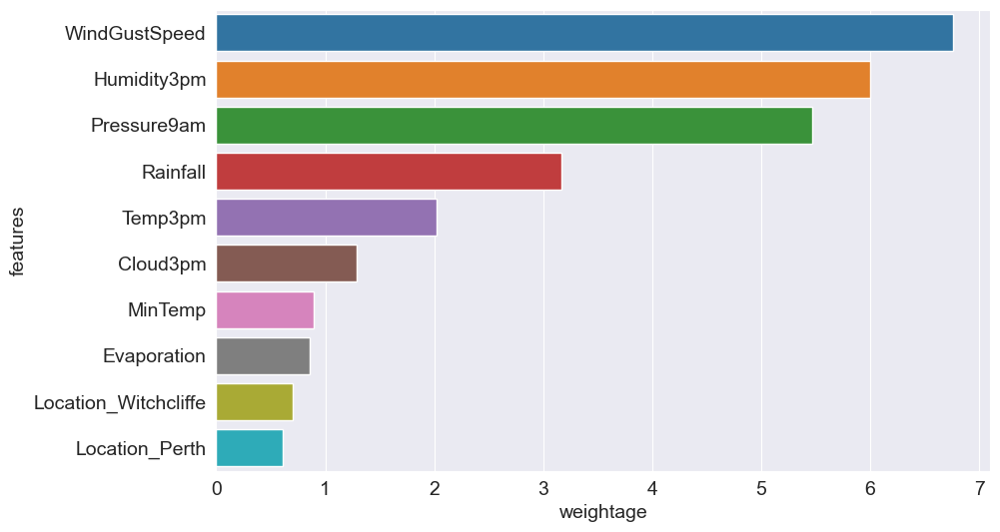

In [92]:
sns.barplot(x='weightage', y='features', data=weight_df.sort_values(by='weightage', ascending=False).head(10))

In [93]:
model.intercept_

array([-2.4495541])

In [94]:
X_train = train_inputs[numerical_cols + encode_cols]
X_val = val_inputs[numerical_cols + encode_cols]
X_test = test_inputs[numerical_cols + encode_cols]

In [95]:
train_pred = model.predict(X_train)

In [96]:
train_pred

array(['No', 'No', 'No', ..., 'No', 'No', 'No'], dtype=object)

In [97]:
train_targets

0         No
1         No
2         No
3         No
4         No
          ..
144548    No
144549    No
144550    No
144551    No
144552    No
Name: RainTomorrow, Length: 97988, dtype: object

In [98]:
from sklearn.metrics import accuracy_score

In [99]:
accuracy_score(train_pred, train_targets)

0.8519206433440829

In [100]:
train_probs = model.predict_proba(X_train)
train_probs

array([[0.94401101, 0.05598899],
       [0.94074127, 0.05925873],
       [0.96093598, 0.03906402],
       ...,
       [0.98749106, 0.01250894],
       [0.98334669, 0.01665331],
       [0.8745336 , 0.1254664 ]])

In [101]:
model.classes_

array(['No', 'Yes'], dtype=object)

In [102]:
from sklearn.metrics import confusion_matrix

In [103]:
from sklearn.metrics import confusion_matrix

In [104]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, confusion_matrix

def predict_and_plot(inputs, targets, name=""):
    # Ensure plt functions are not overridden
    plt.xlabel = plt.matplotlib.pyplot.xlabel
    plt.ylabel = plt.matplotlib.pyplot.ylabel
    plt.title = plt.matplotlib.pyplot.title

    # Predictions
    preds = model.predict(inputs)

    # Calculate accuracy
    accuracy = accuracy_score(targets, preds)
    print("Accuracy: {:.2f}%".format(accuracy * 100))

    # Confusion matrix
    cm = confusion_matrix(targets, preds, normalize="true")
    
    # Plotting confusion matrix
    plt.figure()
    sns.heatmap(cm, annot=True)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title("{} Confusion Matrix".format(name))
    plt.show()

    return preds

Accuracy: 85.19%


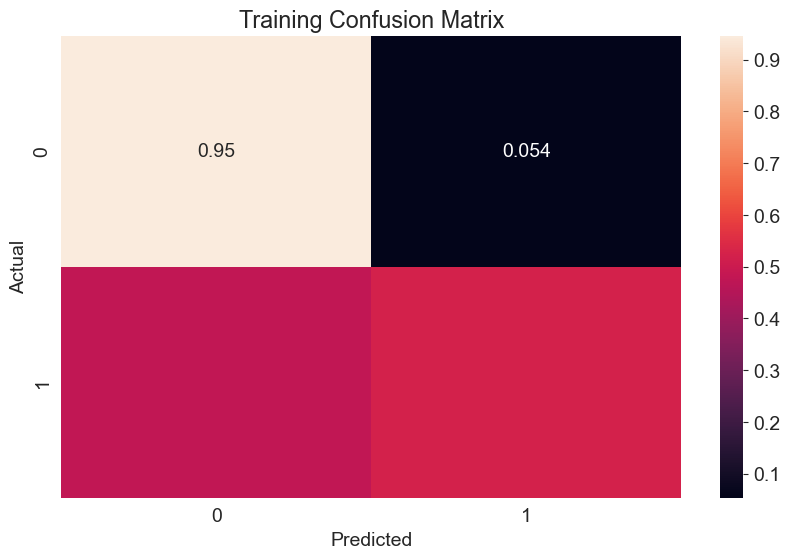

In [105]:
train_preds = predict_and_plot(X_train, train_targets, "Training")

Accuracy: 85.40%


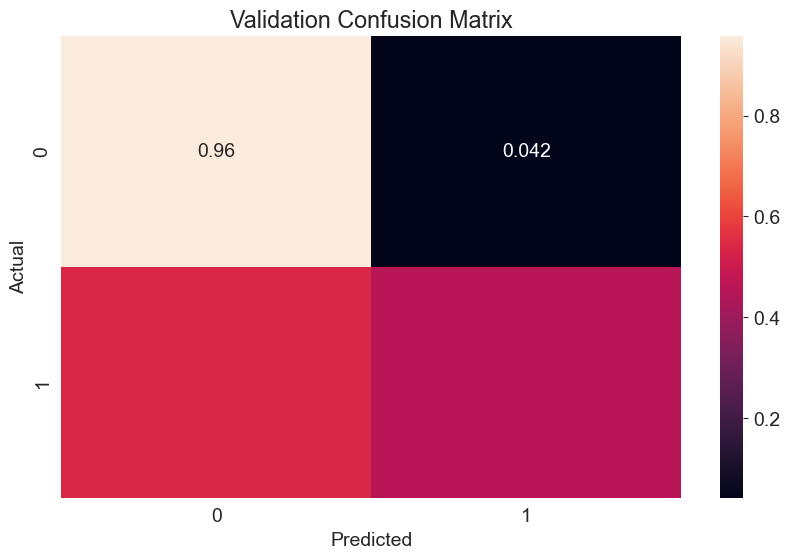

In [106]:
val_preds = predict_and_plot(X_val, val_targets, "Validation")

Accuracy: 84.20%


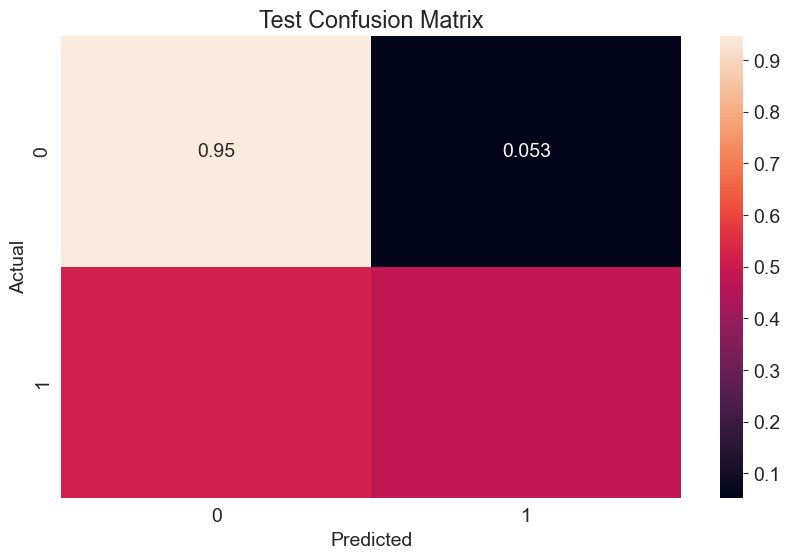

In [107]:
test_preds = predict_and_plot(X_test, test_targets, "Test")

In [108]:
def random_guess(inputs):
  return np.random.choice(["No", "Yes"], len(inputs))

In [109]:
def all_no(inputs):
  return np.full(len(inputs), "No")

In [110]:
accuracy_score(test_targets, random_guess(X_test))

0.49638273045507586

In [111]:
accuracy_score(test_targets, all_no(X_test))

0.7734344612991054

In [112]:
new_input = {'Date': '2021-06-19',
             'Location': 'Katherine',
             'MinTemp': 23.2,
             'MaxTemp': 33.2,
             'Rainfall': 10.2,
             'Evaporation': 4.2,
             'Sunshine': np.nan,
             'WindGustDir': 'NNW',
             'WindGustSpeed': 90.0, # this is an imp feature to determine if it will rain
             'WindDir9am': 'NW',
             'WindDir3pm': 'NNE',
             'WindSpeed9am': 13.0,
             'WindSpeed3pm': 20.0,
             'Humidity9am': 89.0,
             'Humidity3pm': 58.0,
             'Pressure9am': 1004.8,
             'Pressure3pm': 1001.5,
             'Cloud9am': 8.0,
             'Cloud3pm': 5.0,
             'Temp9am': 25.7,
             'Temp3pm': 33.0,
             'RainToday': 'Yes'}

In [113]:
new_input_df = pd.DataFrame([new_input])
new_input_df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
0,2021-06-19,Katherine,23.2,33.2,10.2,4.2,NaN,NNW,90.0,NW,...,20.0,89.0,58.0,1004.8,1001.5,8.0,5.0,25.7,33.0,Yes


In [114]:
new_input_df[numerical_cols] = impute.transform(new_input_df[numerical_cols])
new_input_df[numerical_cols] = scaler.transform(new_input_df[numerical_cols])
new_input_df[encode_cols] = encoder.transform(new_input_df[categorical_cols])

C:\Users\DELL\AppData\Local\Temp\ipykernel_17324\4026272525.py:3: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\DELL\AppData\Local\Temp\ipykernel_17324\4026272525.py:3: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\DELL\AppData\Local\Temp\ipykernel_17324\4026272525.py:3: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented fra

In [115]:
new_input_df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,WindDir3pm_nan,RainToday_No,RainToday_Yes
0,2021-06-19,Katherine,0.747642,0.718336,0.027493,0.028966,0.526244,NNW,0.651163,NW,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [116]:
X_new_input = new_input_df[numerical_cols + encode_cols]
X_new_input

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,WindDir3pm_nan,RainToday_No,RainToday_Yes
0,0.747642,0.718336,0.027493,0.028966,0.526244,0.651163,0.1,0.229885,0.89,0.58,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [117]:
prediction = model.predict(X_new_input)[0]
prediction

'Yes'

In [118]:
prob = model.predict_proba(X_new_input)[0]
prob

array([0.1121914, 0.8878086])

In [119]:
def predict_input(single_input):
  input_df = pd.DataFrame([single_input])
  input_df[numerical_cols] = impute.transform(input_df[numerical_cols])
  input_df[numerical_cols] = scaler.transform(input_df[numerical_cols])
  input_df[encode_cols] = encoder.transform(input_df[categorical_cols])
  X_input = input_df[numerical_cols + encode_cols]
  prediction = model.predict(X_input)[0]
  prob = model.predict_proba(X_input)[0]
  return prediction, prob

In [120]:
new_input = {'Date': '2024-06-14',
             'Location': 'Sydney',
             'MinTemp': 12,
             'MaxTemp': 16,
             'Rainfall': 4.2,
             'Evaporation': 4.2,
             'Sunshine': np.nan,
             'WindGustDir': 'SSW',
             'WindGustSpeed': 17.0,
             'WindDir9am': 'NW',
             'WindDir3pm': 'NNE',
             'WindSpeed9am': 11.0,
             'WindSpeed3pm': 10.0,
             'Humidity9am': 59.0,
             'Humidity3pm': 58.0,
             'Pressure9am': 1004.8,
             'Pressure3pm': 1001.5,
             'Cloud9am': 8.0,
             'Cloud3pm': 5.0,
             'Temp9am': 25.7,
             'Temp3pm': 33.0,
             'RainToday': 'Yes'}

In [121]:
predict_input(new_input)

C:\Users\DELL\AppData\Local\Temp\ipykernel_17324\29881199.py:5: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\DELL\AppData\Local\Temp\ipykernel_17324\29881199.py:5: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\DELL\AppData\Local\Temp\ipykernel_17324\29881199.py:5: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, us

('No', array([0.55720823, 0.44279177]))

In [122]:
import joblib

In [123]:
ausie_rain = {
    'model':model,
    'imputer': impute,
    'scaler': scaler,
    'encoder': encoder,
    'input_cols':input_cols,
    'target_cols': target_col,
    'numerical_cols': numerical_cols,
    'categorical_cols':categorical_cols,
    'encode_cols': encode_cols
}

In [124]:
joblib.dump(ausie_rain, "ausie_rain.joblib")

['ausie_rain.joblib']

In [125]:
aussie_rain2 = joblib.load('ausie_rain.joblib')

In [126]:
aussie_rain2['model']

LogisticRegression(solver='liblinear')

In [127]:
test_preds2 = aussie_rain2['model'].predict(X_test)
accuracy_score(test_targets, test_preds2)

0.8420070011668611